In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

@torch.jit.script
def cd_step_torch(x, y, z, a, b, c, h):
    s = 0.7735
    h1 = s * h
    h2 = (1.0 - s) * h

    # D1
    x1 = (x + h1 * a * y) / (1.0 + h1 * a)
    y1 = (y + h1 * ((c - a) * x1 - x1 * z)) / (1.0 - h1 * c)
    z1 = (z + h1 * x1 * y1) / (1.0 + h1 * b)

    # D2
    z2 = z1 + h2 * (x1 * y1 - b * z1)
    y2 = y1 + h2 * ((c - a) * x1 - x1 * z2 + c * y1)
    x2 = x1 + h2 * a * (y2 - x1)

    return x2, y2, z2

def integrate_cd_cuda(state0, a, b, c, h, n_steps, device):
    x, y, z = state0

    traj_x = torch.empty(n_steps, device=device)

    for i in range(n_steps):
        x, y, z = cd_step_torch(x, y, z, a, b, c, h)
        traj_x[i] = x

    return traj_x, torch.stack([x, y, z])

def local_maxima_cuda(x):
    return x[1:-1][(x[1:-1] > x[:-2]) & (x[1:-1] > x[2:])]

def continuation_1d_cuda(
    param_name: str,
    p_start: float,
    p_end: float,
    num: int,
    state0,
    a0, b0, c0,
    h,
    n_transient,
    n_sample,
    device="cuda"
):
    assert param_name in ("a", "b", "c")

    P_all = []
    X_all = []

    # --- параметры на GPU ---
    a = torch.tensor(a0, device=device)
    b = torch.tensor(b0, device=device)
    c = torch.tensor(c0, device=device)
    h = torch.tensor(h, device=device)

    # начальное состояние
    state = torch.tensor(state0, device=device)

    # значения параметра
    p_values = np.linspace(p_start, p_end, num)

    for p_val in p_values:

        # обновляем параметр
        if param_name == "a":
            a = torch.tensor(p_val, device=device)
        elif param_name == "b":
            b = torch.tensor(p_val, device=device)
        elif param_name == "c":
            c = torch.tensor(p_val, device=device)

        # интегрирование
        traj_x, state_end = integrate_cd_cuda(
            state, a, b, c, h,
            n_transient + n_sample,
            device
        )

        # отбрасываем транзиент
        x = traj_x[n_transient:]

        # локальные максимумы
        xmax = local_maxima_cuda(x)

        if xmax.numel() > 0:
            P_all.append(
                torch.full_like(xmax, p_val, device=device)
            )
            X_all.append(xmax)

        # FORWARD CONTINUATION
        state = state_end

    return (
        torch.cat(P_all).cpu().numpy(),
        torch.cat(X_all).cpu().numpy()
    )


Device: cpu


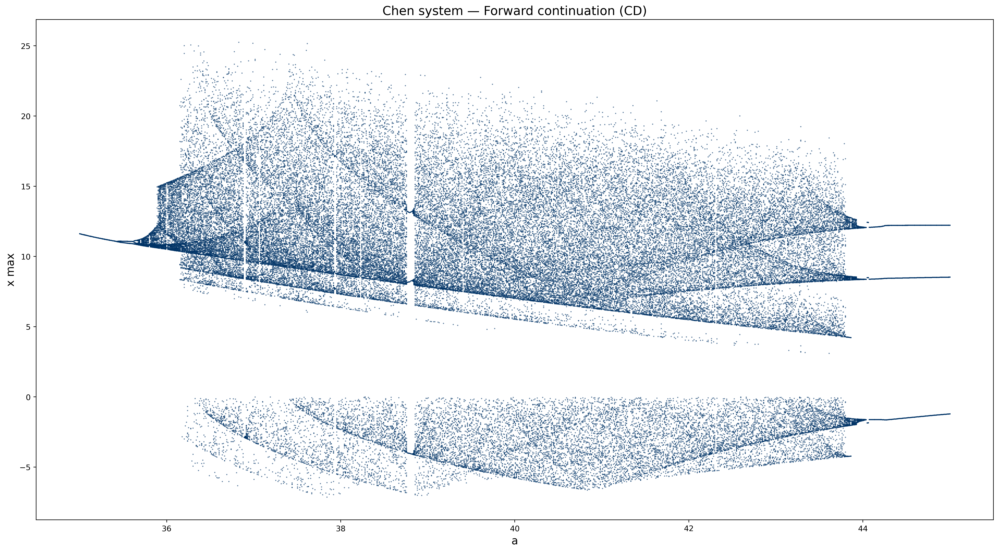

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

state0 = [1.0, 1.0, 1.0]

A, X = continuation_1d_cuda(
    param_name="a",
    p_start=35.0,
    p_end=45.0,
    num=800,
    state0=(1.0, 1.0, 1.0),
    a0=40.0,
    b0=3.0,
    c0=28.0,
    h=0.0025,
    n_transient=30000,
    n_sample=30000,
    device=device
)


plt.figure(figsize=(18, 10), dpi=400)
plt.scatter(A, X, s=0.3, alpha=0.6, color="#003366", rasterized=True)
plt.xlabel("a", fontsize=14)
plt.ylabel("x max", fontsize=14)
plt.title("Chen system — Forward continuation (CD)", fontsize=16)
plt.tight_layout()
plt.show()

Device: cuda


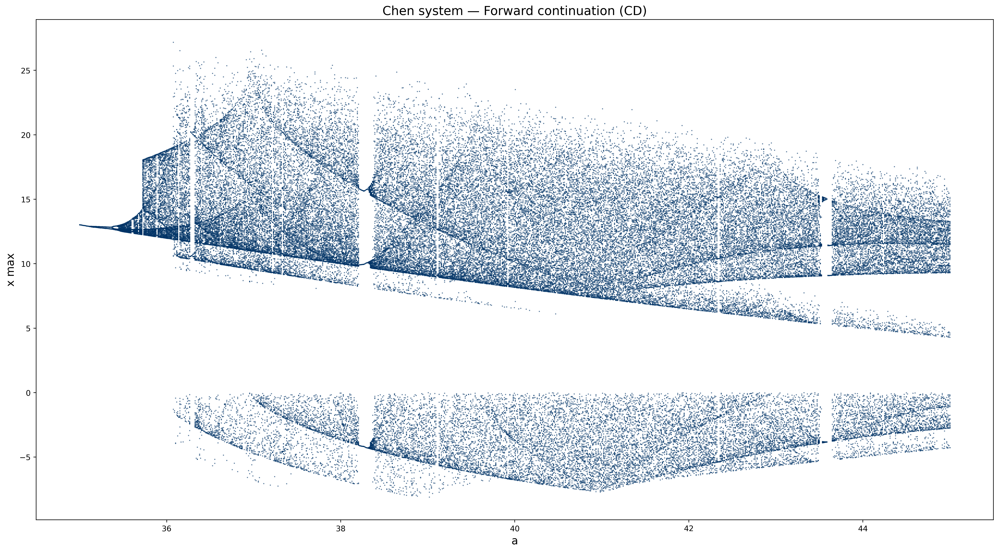

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

state0 = [1.0, 1.0, 1.0]

A, X = continuation_1d_cuda(
    param_name="a",
    p_start=35.0,
    p_end=45.0,
    num=800,
    state0=(1.0, 1.0, 1.0),
    a0=35.0,
    b0=4.0,
    c0=28.0,
    h=0.0025,
    n_transient=30000,
    n_sample=30000,
    device=device
)


plt.figure(figsize=(18, 10), dpi=400)
plt.scatter(A, X, s=0.3, alpha=0.6, color="#003366", rasterized=True)
plt.xlabel("a", fontsize=14)
plt.ylabel("x max", fontsize=14)
plt.title("Chen system — Forward continuation (CD)", fontsize=16)
plt.tight_layout()
plt.show()


Device: cpu


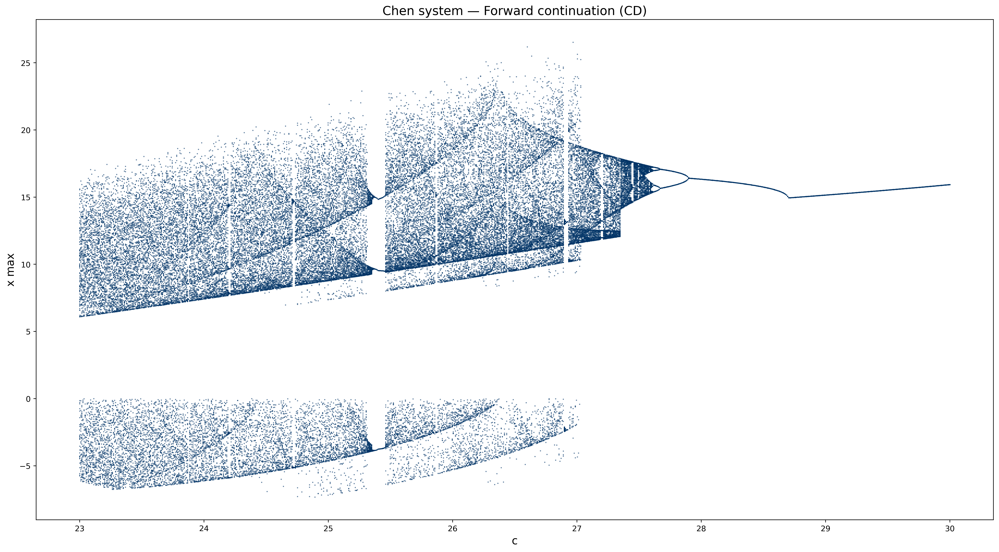

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

state0 = [1.0, 1.0, 1.0]

C, X = continuation_1d_cuda(
    param_name="c",
    p_start=23.0,
    p_end=30.0,
    num=800,
    state0=(1.0, 1.0, 1.0),
    a0=35.0,
    b0=4.0,
    c0=28.0,
    h=0.0025,
    n_transient=30000,
    n_sample=30000,
    device=device
)


plt.figure(figsize=(18, 10), dpi=400)
plt.scatter(C, X, s=0.3, alpha=0.6, color="#003366", rasterized=True)
plt.xlabel("c", fontsize=14)
plt.ylabel("x max", fontsize=14)
plt.title("Chen system — Forward continuation (CD)", fontsize=16)
plt.tight_layout()
plt.show()


Chen System with Variable Symmetry
Parameters: a=40.0, b=3.0, c=28.0, h=0.01, S=0.7735
Device: cuda

STEP 1: Finding attractors
Found attractor: x=10.228, y=6.946, z=23.000
Found attractor: x=-10.228, y=-6.946, z=23.000
Found attractor: x=-1.581, y=-7.132, z=21.264
Found attractor: x=1.581, y=7.132, z=21.264
Found attractor: x=-7.005, y=-4.534, z=20.222
Found attractor: x=7.005, y=4.534, z=20.222

Total attractors found: 6

Final: Found 6 attractors
A1: x=10.228, y=6.946, z=23.000
A2: x=-10.228, y=-6.946, z=23.000
A3: x=-1.581, y=-7.132, z=21.264
A4: x=1.581, y=7.132, z=21.264
A5: x=-7.005, y=-4.534, z=20.222
A6: x=7.005, y=4.534, z=20.222

STEP 2: Visualizing attractors


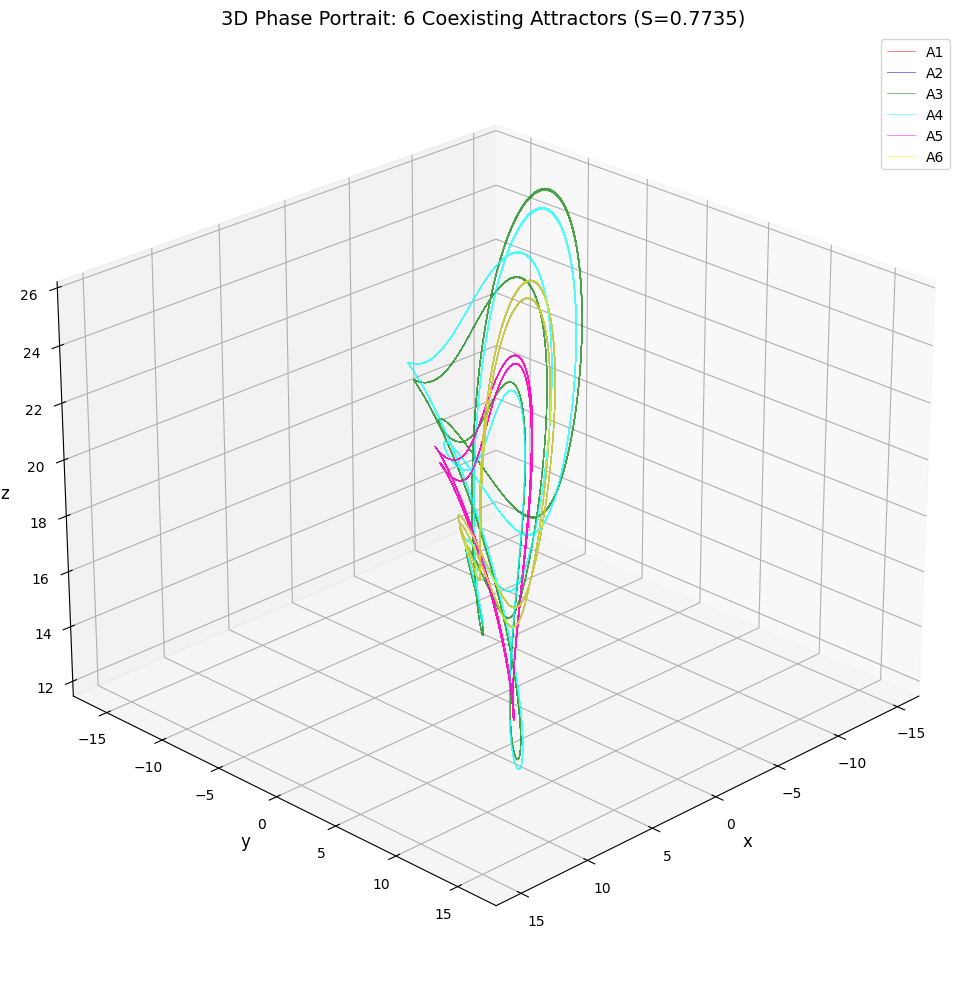


STEP 3: Computing basins of attraction
Computing basins for 6 attractors...


Computing basins: 100%|██████████| 20/20 [00:06<00:00,  3.23it/s]



STEP 4: Visualizing basins


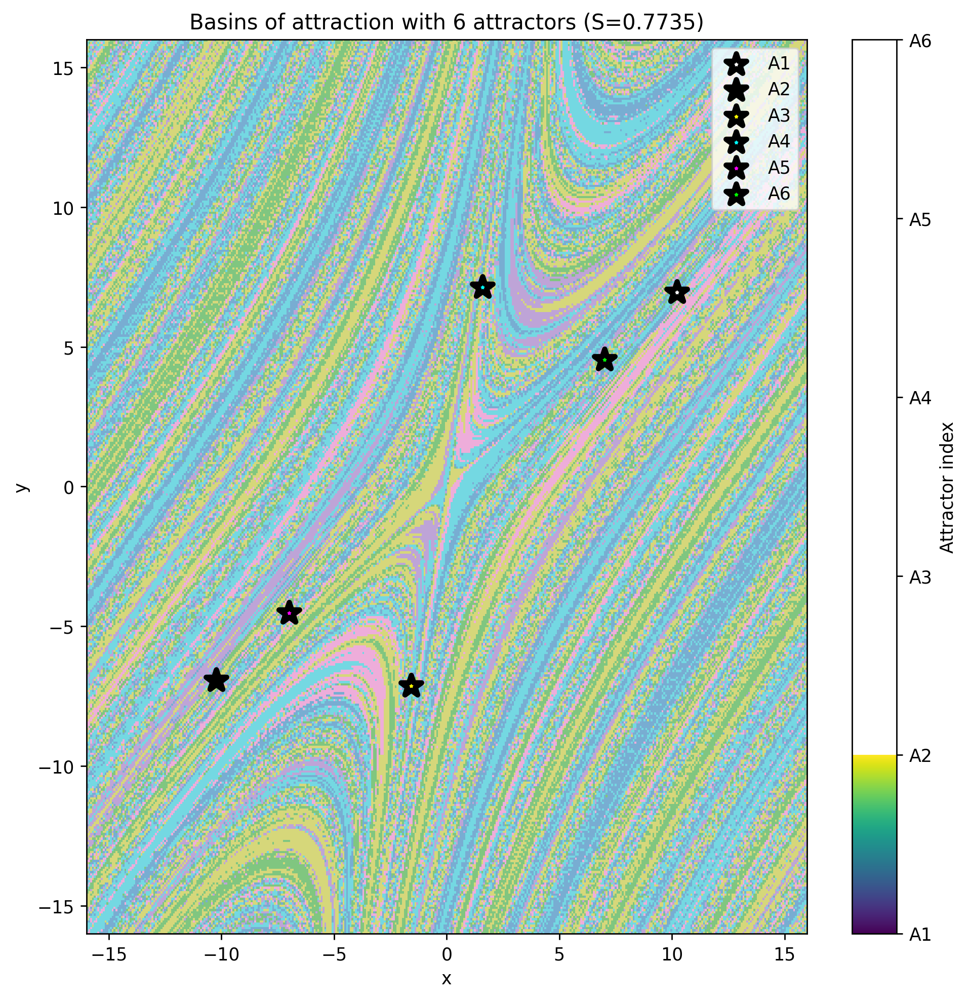

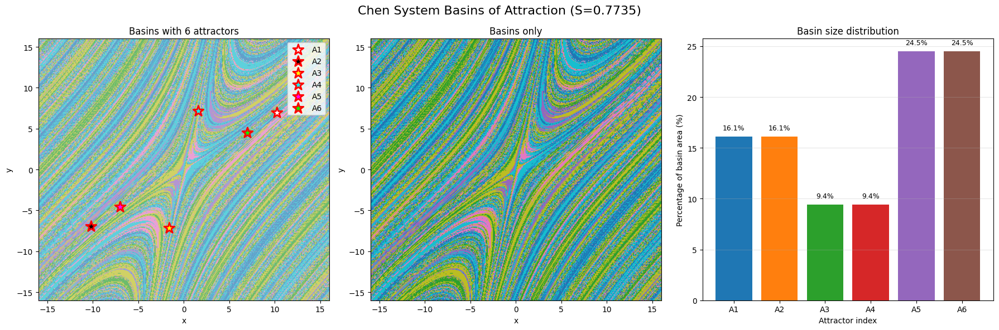


STEP 5: Analysis

Basin statistics:
Total grid points: 160000
Number of attractors in basin map: 6
A1: 25747 points (16.09%)
A2: 25748 points (16.09%)
A3: 15028 points (9.39%)
A4: 15031 points (9.39%)
A5: 39221 points (24.51%)
A6: 39225 points (24.52%)

Symmetry check:
A1 and A2 are symmetric (diff=[1.01962883e-12 1.63424829e-12])
A3 and A4 are symmetric (diff=[0. 0.])
A5 and A6 are symmetric (diff=[0. 0.])


In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# ============================================================
# ПАРАМЕТРЫ СИСТЕМЫ
# ============================================================
a = 40.0
b = 3.0
c = 28.0
dt = 0.01
s = 0.7735

device = "cuda" if torch.cuda.is_available() else "cpu"
torch.set_default_dtype(torch.float64)

# ============================================================
# ФУНКЦИИ ИНТЕГРАЦИИ
# ============================================================
@torch.jit.script
def cd_step_torch(x, y, z, a: float, b: float, c: float, h: float, s: float):
    h1 = s * h
    h2 = (1.0 - s) * h
    x1 = (x + h1 * a * y) / (1.0 + h1 * a)
    y1 = (y + h1 * ((c - a) * x1 - x1 * z)) / (1.0 - h1 * c)
    z1 = (z + h1 * x1 * y1) / (1.0 + h1 * b)
    z2 = z1 + h2 * (x1 * y1 - b * z1)
    y2 = y1 + h2 * ((c - a) * x1 - x1 * z2 + c * y1)
    x2 = x1 + h2 * a * (y2 - x1)
    return x2, y2, z2

@torch.no_grad()
def integrate_cd_batch(x, y, z, a, b, c, h, s, steps):
    """Интеграция батча траекторий"""
    if not isinstance(x, torch.Tensor):
        x = torch.tensor(x, device=device)
    if not isinstance(y, torch.Tensor):
        y = torch.tensor(y, device=device)
    if not isinstance(z, torch.Tensor):
        z = torch.tensor(z, device=device)

    a_f = float(a) if isinstance(a, torch.Tensor) else a
    b_f = float(b) if isinstance(b, torch.Tensor) else b
    c_f = float(c) if isinstance(c, torch.Tensor) else c
    h_f = float(h) if isinstance(h, torch.Tensor) else h

    for _ in range(steps):
        x, y, z = cd_step_torch(x, y, z, a_f, b_f, c_f, h_f, s)
    return x, y, z

@torch.no_grad()
def integrate_cd_trajectory(x0, y0, z0, a, b, c, h, s, steps, device="cuda"):
    """Интеграция одной траектории с возвратом всей траектории"""
    x = torch.tensor(x0, device=device)
    y = torch.tensor(y0, device=device)
    z = torch.tensor(z0, device=device)

    a_f = float(a) if isinstance(a, torch.Tensor) else a
    b_f = float(b) if isinstance(b, torch.Tensor) else b
    c_f = float(c) if isinstance(c, torch.Tensor) else c
    h_f = float(h) if isinstance(h, torch.Tensor) else h

    traj = torch.zeros(steps, 3, device=device)
    for i in range(steps):
        x, y, z = cd_step_torch(x, y, z, a_f, b_f, c_f, h_f, s)
        traj[i] = torch.stack([x, y, z])

    return traj

# ============================================================
# ФУНКЦИИ ДЛЯ БАССЕЙНОВ ПРИТЯЖЕНИЯ
# ============================================================
def make_grid(xlim, ylim, grid, device):
    xs = torch.linspace(xlim[0], xlim[1], grid, device=device)
    ys = torch.linspace(ylim[0], ylim[1], grid, device=device)
    X, Y = torch.meshgrid(xs, ys, indexing="ij")
    Z = torch.zeros_like(X)
    return X.reshape(-1), Y.reshape(-1), Z.reshape(-1)

def assign_basins(x, y, z, attractors_tensor):
    """Назначение бассейнов притяжения"""
    pts = torch.stack([x, y, z], dim=1)
    dists = torch.cdist(pts, attractors_tensor)
    return torch.argmin(dists, dim=1)

def basins_of_attraction(
    attractors,
    a, b, c,
    xlim=(-16, 16),
    ylim=(-16, 16),
    grid=600,
    h=0.01,
    s=0.7735,
    steps=8000,
    batch=8192,
    device="cuda"
):
    """
    Вычисление бассейнов притяжения

    Parameters:
    -----------
    attractors : list or tensor
        Список тензоров или тензор с центрами аттракторов
    """
    # Преобразуем attractors в тензор, если это список
    if isinstance(attractors, list):
        attractors_tensor = torch.stack(attractors).to(device)
    else:
        attractors_tensor = attractors.to(device)

    print(f"Computing basins for {len(attractors_tensor)} attractors...")

    X, Y, Z = make_grid(xlim, ylim, grid, device)
    N = X.numel()

    basin_id = torch.empty(N, dtype=torch.long, device=device)

    for i in tqdm(range(0, N, batch), desc="Computing basins"):
        sl = slice(i, min(i + batch, N))

        x_final, y_final, z_final = integrate_cd_batch(
            X[sl], Y[sl], Z[sl],
            a, b, c, h, s,
            steps
        )

        basin_id[sl] = assign_basins(x_final, y_final, z_final, attractors_tensor)

    xs = torch.linspace(xlim[0], xlim[1], grid).cpu().numpy()
    ys = torch.linspace(ylim[0], ylim[1], grid).cpu().numpy()

    return xs, ys, basin_id.reshape(grid, grid).cpu().numpy()

# ============================================================
# ВИЗУАЛИЗАЦИЯ БАССЕЙНОВ
# ============================================================
def plot_basins_with_attractors(xs, ys, basin, attractors):
    """Визуализация бассейнов с наложенными аттракторами"""
    plt.figure(figsize=(8, 8), dpi=250)

    # Бассейны
    plt.imshow(
        basin,
        extent=[xs[0], xs[-1], ys[0], ys[-1]],
        origin="lower",
        cmap="tab10",
        aspect='auto',
        alpha=0.6
    )

    # Преобразуем attractors в numpy для отображения
    if isinstance(attractors, list):
        attractors_np = torch.stack(attractors).cpu().numpy()
    else:
        attractors_np = attractors.cpu().numpy()

    # Аттракторы
    colors = ['white', 'black', 'yellow', 'cyan', 'magenta', 'lime', 'orange', 'purple']
    for k, attr in enumerate(attractors_np):
        plt.scatter(attr[0], attr[1],
                   s=150, color=colors[k % len(colors)],
                   edgecolor='black', linewidth=3,
                   marker='*', label=f'A{k+1}',
                   zorder=10)

    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(f"Basins of attraction with {len(attractors_np)} attractors (S={s})")
    plt.legend(loc='upper right')

    # Добавляем colorbar с правильными метками
    cbar = plt.colorbar(label='Attractor index')

    # Устанавливаем целочисленные тики на colorbar
    unique_indices = np.unique(basin)
    cbar.set_ticks(unique_indices)
    cbar.set_ticklabels([f'A{int(i)+1}' for i in unique_indices])

    plt.tight_layout()
    plt.show()

def plot_basins_comprehensive(xs, ys, basin, attractors):
    """Комплексная визуализация бассейнов"""
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # 1. Бассейны с аттракторами
    im = axes[0].imshow(
        basin,
        extent=[xs[0], xs[-1], ys[0], ys[-1]],
        origin="lower",
        cmap="tab10",
        aspect='auto',
        alpha=0.7
    )

    # Преобразуем attractors в numpy
    if isinstance(attractors, list):
        attractors_np = torch.stack(attractors).cpu().numpy()
    else:
        attractors_np = attractors.cpu().numpy()

    # Отмечаем аттракторы
    colors = ['white', 'black', 'yellow', 'cyan', 'magenta', 'lime']
    for k, attr in enumerate(attractors_np):
        axes[0].scatter(attr[0], attr[1],
                       s=200, color=colors[k % len(colors)],
                       edgecolor='red', linewidth=2,
                       marker='*', label=f'A{k+1}',
                       zorder=10)

    axes[0].set_xlabel("x")
    axes[0].set_ylabel("y")
    axes[0].set_title(f"Basins with {len(attractors_np)} attractors")
    axes[0].legend(loc='upper right')
    axes[0].grid(True, alpha=0.3)

    # 2. Только бассейны
    axes[1].imshow(
        basin,
        extent=[xs[0], xs[-1], ys[0], ys[-1]],
        origin="lower",
        cmap="tab10",
        aspect='auto'
    )
    axes[1].set_xlabel("x")
    axes[1].set_ylabel("y")
    axes[1].set_title("Basins only")

    # 3. Распределение по бассейнам
    unique, counts = np.unique(basin, return_counts=True)
    total = basin.size
    percentages = (counts / total * 100)

    bars = axes[2].bar(unique, percentages, color=plt.cm.tab10(unique))
    axes[2].set_xlabel("Attractor index")
    axes[2].set_ylabel("Percentage of basin area (%)")
    axes[2].set_title("Basin size distribution")
    axes[2].set_xticks(unique)
    axes[2].set_xticklabels([f'A{int(i)+1}' for i in unique])
    axes[2].grid(True, alpha=0.3, axis='y')

    # Добавляем проценты на столбцы
    for bar, perc in zip(bars, percentages):
        height = bar.get_height()
        axes[2].text(bar.get_x() + bar.get_width()/2., height + 0.5,
                    f'{perc:.1f}%', ha='center', va='bottom', fontsize=9)

    plt.suptitle(f"Chen System Basins of Attraction (S={s})", fontsize=16)
    plt.tight_layout()
    plt.show()

# ============================================================
# ПОИСК АТТРАКТОРОВ (упрощенная версия)
# ============================================================
def find_attractors_simple():
    """Упрощенный поиск аттракторов для S=0.7735"""

    # На основе статьи и предыдущих экспериментов
    strategic_points = [
        # Основные хаотические (симметричная пара)
        (8.0, 8.0, 18.0),
        (-8.0, -8.0, 18.0),

        # Первая пара периодических
        (12.0, 4.0, 22.0),
        (-12.0, -4.0, 22.0),

        # Вторая пара периодических
        (4.0, 12.0, 20.0),
        (-4.0, -12.0, 20.0),

        # Центральный (может быть периодическим или хаотическим)
        (0.1, 0.1, 18.0),
        (-0.1, -0.1, 18.0),
    ]

    attractors = []

    for x0, y0, z0 in strategic_points:
        # Интегрируем с длинной траекторией
        traj = integrate_cd_trajectory(
            x0, y0, z0, a, b, c, dt, s,
            steps=20000, device=device
        ).cpu().numpy()

        # Берем конечную точку
        final_point = traj[-1]
        center = torch.tensor(final_point, device=device)

        # Проверяем, не дубликат ли это
        is_new = True
        for existing in attractors:
            if torch.norm(center - existing) < 1.5:
                is_new = False
                break

        if is_new:
            attractors.append(center)
            print(f"Found attractor: x={center[0]:.3f}, y={center[1]:.3f}, z={center[2]:.3f}")

    print(f"\nTotal attractors found: {len(attractors)}")
    return attractors

# ============================================================
# ВИЗУАЛИЗАЦИЯ АТТРАКТОРОВ
# ============================================================
def visualize_attractors_3d(attractors):
    """3D визуализация аттракторов"""
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    colors = ['red', 'blue', 'green', 'cyan', 'magenta', 'yellow', 'orange', 'purple']

    for k, center in enumerate(attractors):
        traj = integrate_cd_trajectory(
            center[0].item(),
            center[1].item(),
            center[2].item(),
            a, b, c, dt, s,
            steps=15000, device=device
        ).cpu().numpy()

        # Берем асимптотическую часть
        traj = traj[5000:]

        ax.plot(traj[:, 0], traj[:, 1], traj[:, 2],
                lw=0.5, alpha=0.7,
                color=colors[k % len(colors)],
                label=f'A{k+1}')

    ax.set_xlabel("x", fontsize=12)
    ax.set_ylabel("y", fontsize=12)
    ax.set_zlabel("z", fontsize=12)
    ax.set_title(f"3D Phase Portrait: {len(attractors)} Coexisting Attractors (S={s})", fontsize=14)
    ax.legend(loc='upper right', fontsize=10)
    ax.view_init(elev=25, azim=45)

    plt.tight_layout()
    plt.show()

# ============================================================
# ГЛАВНАЯ ФУНКЦИЯ
# ============================================================
if __name__ == "__main__":
    print(f"Chen System with Variable Symmetry")
    print(f"Parameters: a={a}, b={b}, c={c}, h={dt}, S={s}")
    print(f"Device: {device}")

    # 1. Поиск аттракторов
    print("\n" + "="*60)
    print("STEP 1: Finding attractors")
    print("="*60)

    attractors = find_attractors_simple()

    if len(attractors) < 4:
        print("Warning: Found less than 4 attractors. Trying additional points...")
        additional_points = [
            (6.0, 14.0, 17.0), (-6.0, -14.0, 17.0),
            (14.0, 6.0, 23.0), (-14.0, -6.0, 23.0),
            (2.0, 8.0, 19.0), (-2.0, -8.0, 19.0),
        ]

        for x0, y0, z0 in additional_points:
            traj = integrate_cd_trajectory(
                x0, y0, z0, a, b, c, dt, s,
                steps=20000, device=device
            ).cpu().numpy()

            final_point = traj[-1]
            center = torch.tensor(final_point, device=device)

            is_new = True
            for existing in attractors:
                if torch.norm(center - existing) < 1.5:
                    is_new = False
                    break

            if is_new:
                attractors.append(center)
                print(f"Additional attractor: x={center[0]:.3f}, y={center[1]:.3f}, z={center[2]:.3f}")

    print(f"\nFinal: Found {len(attractors)} attractors")
    for i, attr in enumerate(attractors):
        print(f"A{i+1}: x={attr[0]:.3f}, y={attr[1]:.3f}, z={attr[2]:.3f}")

    # 2. Визуализация аттракторов
    print("\n" + "="*60)
    print("STEP 2: Visualizing attractors")
    print("="*60)

    visualize_attractors_3d(attractors)

    # 3. Вычисление бассейнов притяжения
    print("\n" + "="*60)
    print("STEP 3: Computing basins of attraction")
    print("="*60)

    # Используем меньшую сетку для быстрого тестирования
    grid_size = 400  # Можно увеличить до 600-800 для лучшего разрешения

    xs, ys, basin = basins_of_attraction(
        attractors,
        a, b, c,
        xlim=(-16, 16),
        ylim=(-16, 16),
        grid=grid_size,
        steps=10000,  # Увеличиваем для лучшей сходимости
        device=device
    )

    # 4. Визуализация бассейнов
    print("\n" + "="*60)
    print("STEP 4: Visualizing basins")
    print("="*60)

    plot_basins_with_attractors(xs, ys, basin, attractors)
    plot_basins_comprehensive(xs, ys, basin, attractors)

    # 5. Анализ результатов
    print("\n" + "="*60)
    print("STEP 5: Analysis")
    print("="*60)

    unique, counts = np.unique(basin, return_counts=True)
    total = basin.size

    print(f"\nBasin statistics:")
    print(f"Total grid points: {total}")
    print(f"Number of attractors in basin map: {len(unique)}")

    for idx, count in zip(unique, counts):
        percentage = count / total * 100
        print(f"A{int(idx)+1}: {count} points ({percentage:.2f}%)")

    # Проверка симметрии
    print(f"\nSymmetry check:")
    attractors_np = torch.stack(attractors).cpu().numpy()
    for i in range(len(attractors_np)):
        for j in range(i+1, len(attractors_np)):
            diff = np.abs(attractors_np[i] + attractors_np[j])  # Для симметрии x,y должны быть противоположны
            if np.all(diff[:2] < 2.0):  # Проверяем только x и y
                print(f"A{i+1} and A{j+1} are symmetric (diff={diff[:2]})")